In [20]:
import os
import torch
import torch.nn as nn
import torchvision.models as models
from PIL import Image
from IPython.display import display
import xml.etree.ElementTree as ET
from torch.utils.data import DataLoader
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms

In [4]:
def load_data(data_folder, data_type="training"):
    image_folder = os.path.join(data_folder, "Tissue Images")
    annotation_folder = os.path.join(data_folder, "Annotations")

    image_files = [f for f in os.listdir(image_folder) if f.endswith(".tif")]
    annotation_files = [f for f in os.listdir(annotation_folder) if f.endswith(".xml")]

    # Make sure the lists are sorted for proper synchronization
    image_files.sort()
    annotation_files.sort()

    # Initialize lists to store image paths and corresponding annotation paths
    image_paths = [os.path.join(image_folder, filename) for filename in image_files]
    annotation_paths = [os.path.join(annotation_folder, filename) for filename in annotation_files]

    # Ensure that the number of images and annotations match
    assert len(image_paths) == len(annotation_paths), "Mismatch between images and annotations"

    # Load images and annotations
    images = [Image.open(image_path) for image_path in image_paths]
    annotations = [load_annotations(annotation_path) for annotation_path in annotation_paths]

    return images, annotations

def load_annotations(xml_path):
    tree = ET.parse(xml_path)
    root = tree.getroot()

    annotations = []

    for annotation_elem in root.findall('.//Annotation'):
        annotation = {'Id': annotation_elem.get('Id'),
                      'Type': annotation_elem.get('Type'),
                      'Vertices': []}

        for vertex_elem in annotation_elem.findall('.//Vertex'):
            vertex = {'X': float(vertex_elem.get('X')),
                      'Y': float(vertex_elem.get('Y'))}
            annotation['Vertices'].append(vertex)

        annotations.append(annotation)

    return annotations



In [11]:
# Example usage for loading training data
training_data_folder = os.path.join("MoNuSegTrainData", "MoNuSeg 2018 Training Data")
training_images, training_annotations = load_data(training_data_folder, data_type="training")

# Example usage for loading test data
test_data_folder = "MoNuSegTestData"
test_images, test_annotations = load_data(test_data_folder, data_type="test")



Resized Image: (300, 300), Annotations: 1


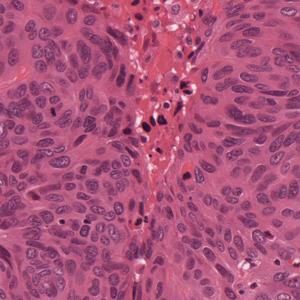

Resized Image: (300, 300), Annotations: 1


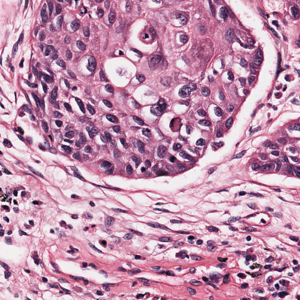

Resized Image: (300, 300), Annotations: 1


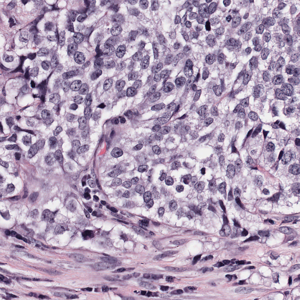

Resized Image: (300, 300), Annotations: 1


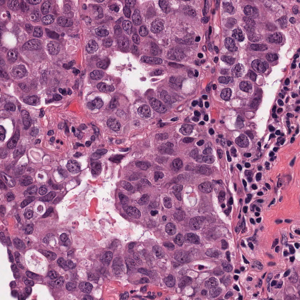

Resized Image: (300, 300), Annotations: 1


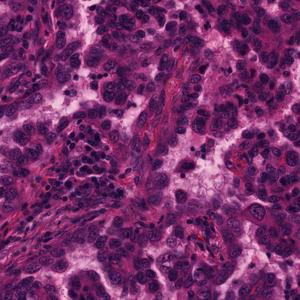

Resized Image: (300, 300), Annotations: 1


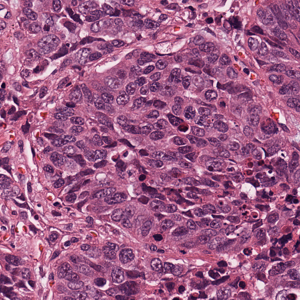

Resized Image: (300, 300), Annotations: 1


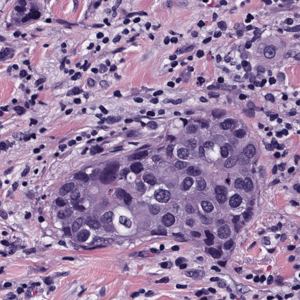

Resized Image: (300, 300), Annotations: 1


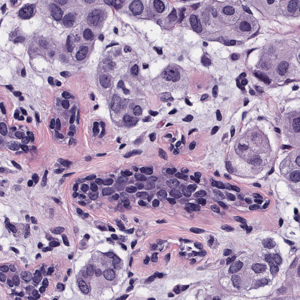

Resized Image: (300, 300), Annotations: 1


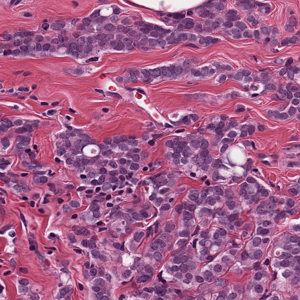

Resized Image: (300, 300), Annotations: 1


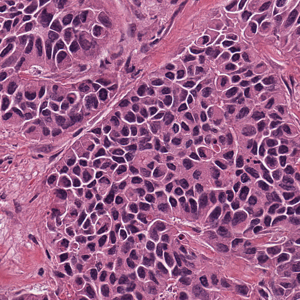

Resized Image: (300, 300), Annotations: 1


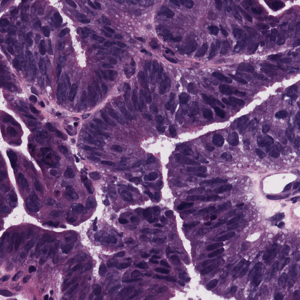

Resized Image: (300, 300), Annotations: 1


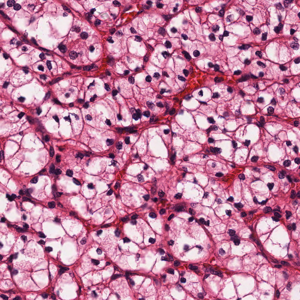

Resized Image: (300, 300), Annotations: 1


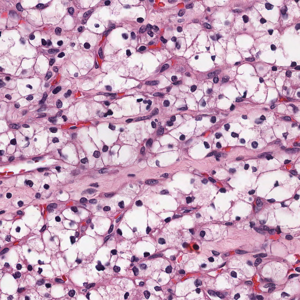

Resized Image: (300, 300), Annotations: 1


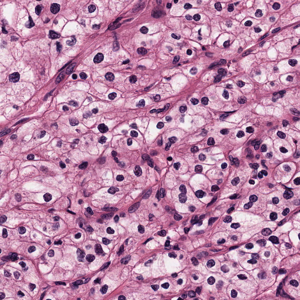

Resized Image: (300, 300), Annotations: 1


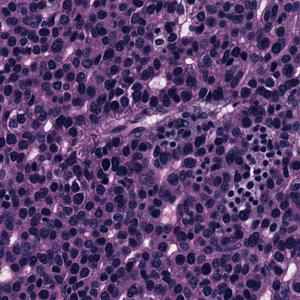

Resized Image: (300, 300), Annotations: 1


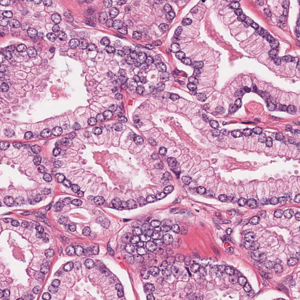

Resized Image: (300, 300), Annotations: 1


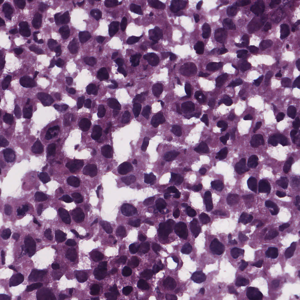

Resized Image: (300, 300), Annotations: 1


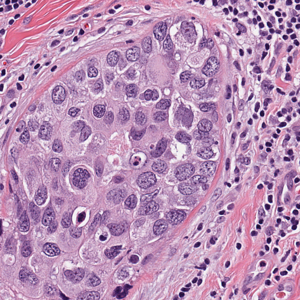

Resized Image: (300, 300), Annotations: 1


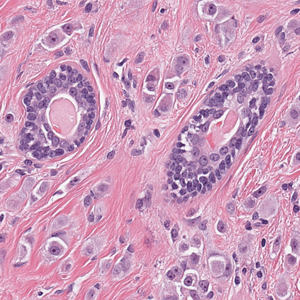

Resized Image: (300, 300), Annotations: 1


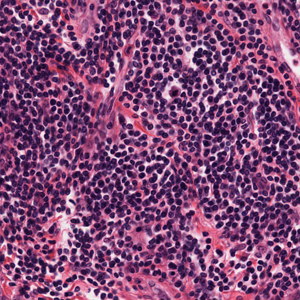

Resized Image: (300, 300), Annotations: 1


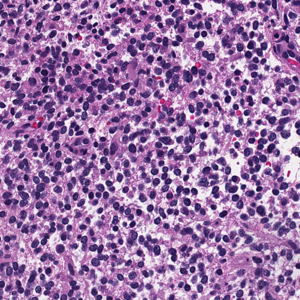

Resized Image: (300, 300), Annotations: 1


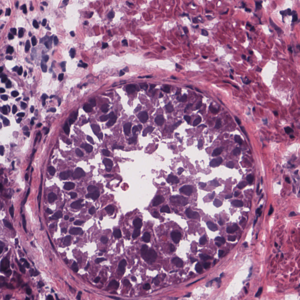

Resized Image: (300, 300), Annotations: 1


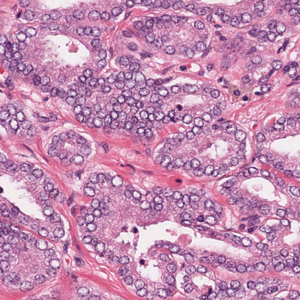

Resized Image: (300, 300), Annotations: 1


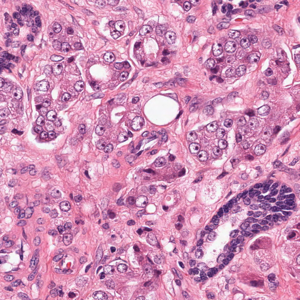

Resized Image: (300, 300), Annotations: 1


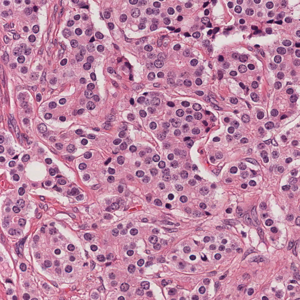

Resized Image: (300, 300), Annotations: 1


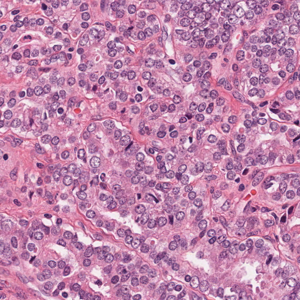

Resized Image: (300, 300), Annotations: 1


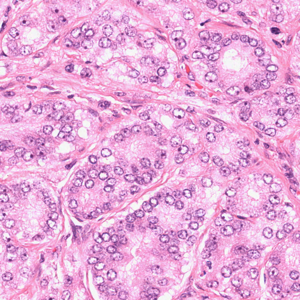

Resized Image: (300, 300), Annotations: 1


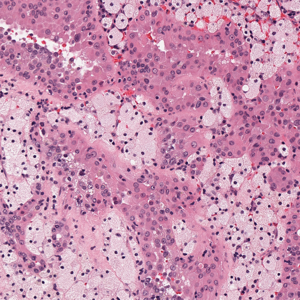

Resized Image: (300, 300), Annotations: 2


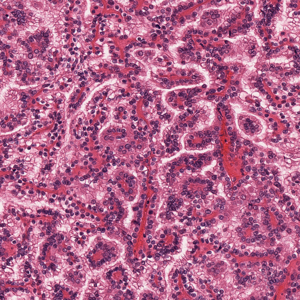

Resized Image: (300, 300), Annotations: 1


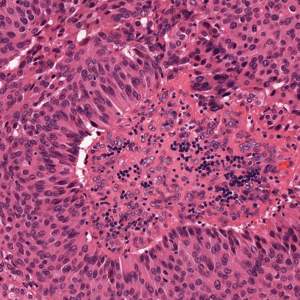

Resized Image: (300, 300), Annotations: 1


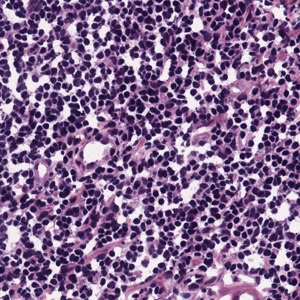

Resized Image: (300, 300), Annotations: 1


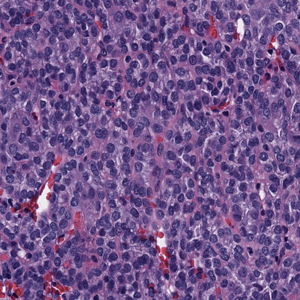

Resized Image: (300, 300), Annotations: 1


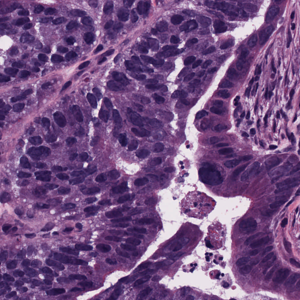

Resized Image: (300, 300), Annotations: 1


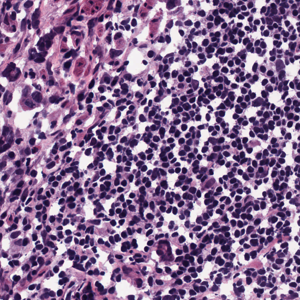

Resized Image: (300, 300), Annotations: 1


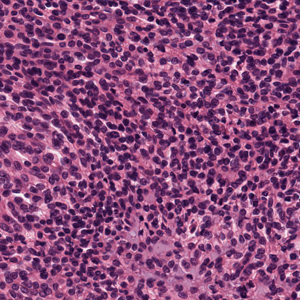

Resized Image: (300, 300), Annotations: 1


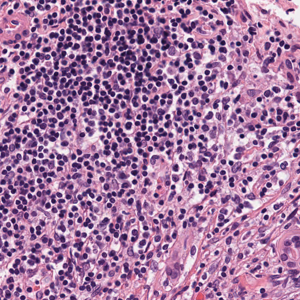

Resized Image: (300, 300), Annotations: 1


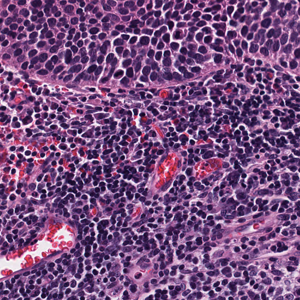

Resized Image: (300, 300), Annotations: 1


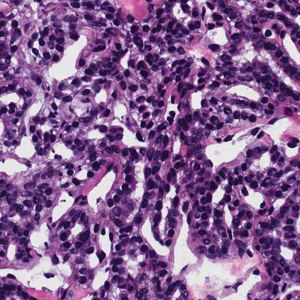

Resized Image: (300, 300), Annotations: 1


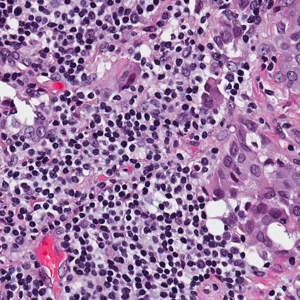

Resized Image: (300, 300), Annotations: 1


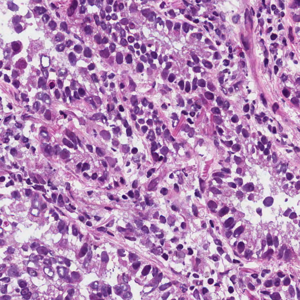

Resized Image: (300, 300), Annotations: 1


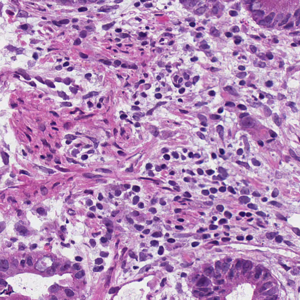

Resized Image: (300, 300), Annotations: 1


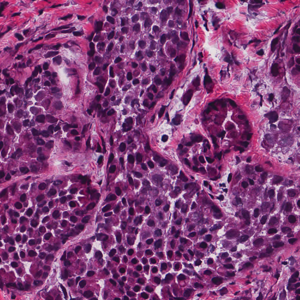

Resized Image: (300, 300), Annotations: 1


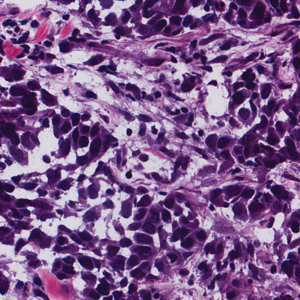

Resized Image: (300, 300), Annotations: 1


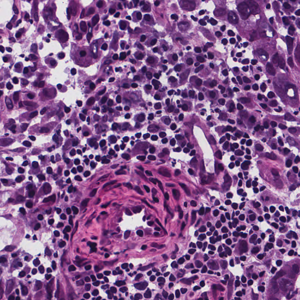

Resized Image: (300, 300), Annotations: 1


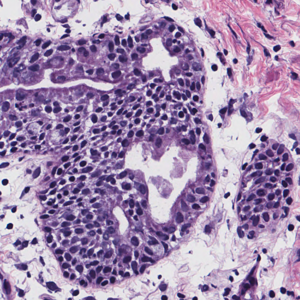

Resized Image: (300, 300), Annotations: 1


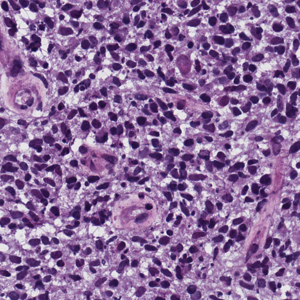

Resized Image: (300, 300), Annotations: 1


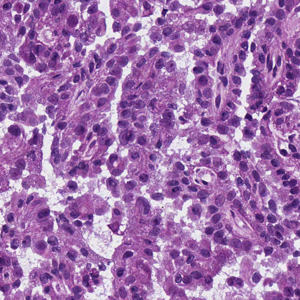

Resized Image: (300, 300), Annotations: 1


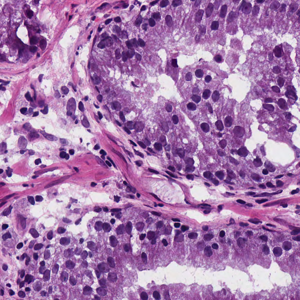

Resized Image: (300, 300), Annotations: 1


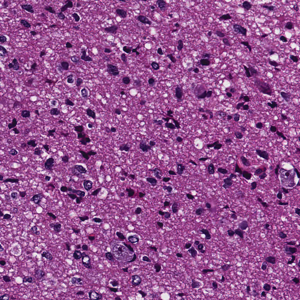

Resized Image: (300, 300), Annotations: 1


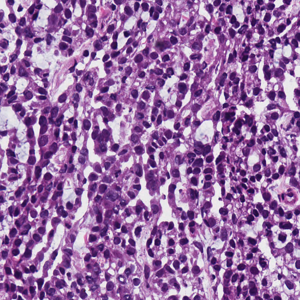

Resized Image: (300, 300), Annotations: 1


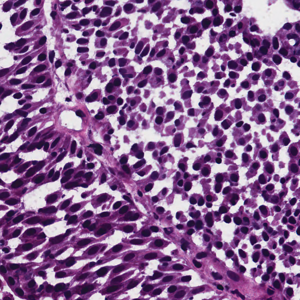

In [15]:
all_images = training_images + test_images
all_annotations = training_annotations + test_annotations
target_size = (300, 300)

for image, annotation in zip(all_images, all_annotations):
    # Resize the image
    resized_image = image.resize(target_size)
    
    print(f"Resized Image: {resized_image.size}, Annotations: {len(annotation)}")
    
    # Display the resized image
    display(resized_image)

In [18]:
class CustomDataset(Dataset):
    def __init__(self, images, annotations, transform=None):
        self.images = images
        self.annotations = annotations
        self.transform = transform

    def __len__(self):
        return len(self.images)

    def __getitem__(self, index):
        image = self.images[index]
        annotation = self.annotations[index]

        # Apply transformations if specified
        if self.transform:
            image = self.transform(image)

        return image, annotation

target_size = (256, 256)

data_transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
])

# Resize images, create a dataset
train_resized_images = [image.resize(target_size) for image in training_images]
test_resized_images = [image.resize(target_size) for image in test_images]

train_dataset = CustomDataset(train_resized_images, training_annotations, transform=data_transform)
test_dataset  = CustomDataset(test_resized_images, test_annotations, transform=data_transform)

# Assuming you have loaded training and test data as 'train_dataset' and 'test_dataset'
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)


In [21]:
# Define the U-Net model
class UNet(nn.Module):
    def __init__(self, num_classes):
        super(UNet, self).__init__()
        # Use a pre-trained ResNet18 as the encoder
        self.encoder = models.resnet18(pretrained=True)
        
        # Remove the classification head
        self.encoder = nn.Sequential(*list(self.encoder.children())[:-2])
        
        # Define the decoder
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(512, 256, kernel_size=2, stride=2),
            nn.ConvTranspose2d(256, 128, kernel_size=2, stride=2),
            nn.ConvTranspose2d(128, 64, kernel_size=2, stride=2),
            nn.ConvTranspose2d(64, num_classes, kernel_size=2, stride=2)
        )

    def forward(self, x):
        # Forward pass through the encoder
        x = self.encoder(x)
        
        # Forward pass through the decoder
        x = self.decoder(x)
        return x

# Instantiate the UNet model
num_classes = 1  # Adjust based on your task
unet_model = UNet(num_classes)

# Print the model architecture
print(unet_model)

c:\Users\Bryon\AppData\Local\Programs\Python\Python310\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\Bryon\AppData\Local\Programs\Python\Python310\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


UNet(
  (encoder): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (4): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  